# Advanced Spatial Analysis

## Spatial AutoCorrelation (AKA First Law of Geography)

><em><h4>Everything is related to everything else, but near things are more related than far things (Tobler 1970)</h4></em>

>"**Data from locations near one another in space** are more likely to be **similar than data from locations remote from one another**."

Another simple definition:

>"Degree to which **similar values are located in similar locations**."

And for the statistically inclined folks

>Spatial autocorrelation implies a **nonzero covariance between the values on a random variable for neighboring locations**:


$$Cov(y_i,y_j) = E(y_iy_j)-E(y_i)E(y_j)\neq{0}\text{ for i} \neq{j}$$
where the *i,j* locations have a spatial interpretation.

**If spatial autocorrelation were not commonplace, geographic analysis would be of little interest, and geographic analysis would be of little interest and geography would be irrelevant.**

Many geographical phenomenon can be characterized in these terms
​
<ul><li><b>Cities are local concentration of populations</b></li>
<li><b>Storms are local foci of particular atmospheric conditions</b></li>
<li><b>Climate: Repeated occurrences of similar spatial pattern of weather in particular places.</b></li>
<li><b>In the case of temperature, points close to a heat source will have a higher temperature that those far from it or closer to a cold spot.</b></li> 
<li><b>If we study the distribution of an infectious disease, reported cases are likely to appear grouped and a large number of them normally cause the nearby populations to also be significantly affected by the disease.</b></li> 
</ul>

Let us look at some simple examples

![Package ](images/withoutspatialautocorrelation.png)

Now lets take another interesting example of two hypothetical regions A and B where people speak French and German respectively. Now if there was no spatial autocorrelation then people everywhere within the same state irrespective of whether they are living near to border or not will speak the same language. But with spatial autocorrelation people living in the border areas would have a cultural influence of the other region and hence might know both the languages (again this is not mandatory, but there is a higher chance).

![admethod2 ](images/admethod2.png)


### Types of Spatial AutoCorrelation

#### Positive Spatial Autocorrelation

Positive autocorrelation is by far the most commonly observed case and refers to situations where **nearby observations are likely to be similar to one another**. For eg. Neighboring countries have similar economic policies or neighboring voters favor the same candidate. Other examples include income, poverty, vegetation, and Temperature.

#### Negative Spatial Autocorrelation

Negative spatial autocorrelation exists when neighboring units may have dissimilar values on the variable. Eg. Crime moves from one precinct to a neighboring precinct. Eg: supermarkets, police stations, fire stations, and hospitals.

#### Zero Spatial Autocorrelation

Zero autocorrelation is the case where no spatial effect is discernable, and observations seem to vary randomly through space. 

![admethod3 ](images/admethod3.png)

### Implication of Spatial Autocorrelation

<ul> <li> Most of the statistical approaches often assume that the <b>measured outcomes are independent of each other.</b> </li>
<li>In statistics a collection of random variables is <b>independent and identically distributed (i.i.d)</b> if each random variable has the <b>same probability distribution</b> as the others and are <b>mutually independent</b></li>.
<li> Spatial data exhibiting <b>spatial autocorrelation violates i.i.d</b></li>
<li>If positive correlation exists, <b>statistical inference is less effective</b>. The <b>same number of observations contain less information about the phenomena represented by the variable</b>.
<li><b>Detection and quantification</b> of Spatial autocorrelation is important in identifying <b>clusters</b> as well as in <b>predictive analysis (includes interpolation)</b></li>
<li> <b>Spatial weighting schemes</b> are required to incorporate the <b>effect of spatial autocorrelation</b> on statistical methods (which we are covering on the next chapter). </li>
</ul>

## Kernel Density Estimate (KDE)

![adv1 ](images/adv1.jpg)

.......have yo seen such maps??

In simple terms **Density mapping is simply a way to show where points or lines may be concentrated in a given area**.

Let's look at how density is calculated. 

### How Kernel Density is Estimated

KDE allows one to **estimate the intensity of a point pattern and to represent it by means of a smoothed three-dimensional continuous surface that represents the variation of density of point events across the study region**. The procedure can be organized in three steps

1. A **fine Grid is placed over the study region and the distribution of events**. 

2. A moving three-dimensional function visits each cell and calculates weights for each point within the function's radius (threshold or bandwidth). In most of the kernel functions considered, **events closer to the center are given a higher weight than those located at the edge of the search function, therefore contributing more to the reference cell's density value.**

3. Grid cell values are calculated by **summing the values of all surfaces for each location**.


![admethod4 ](images/admethod4.png)

4. For those who are interested in knowing about the equation behind it 

![admethod5 ](images/admethod5.png)

where i = 1..n are the total input points. We will use only points that fall within the radius distance. 

pop<sub>i</sub> is the population field value of point (event). By default this is one. But you can weight this by other values too. For example if an event point indicates the number of people died, we can use that number as the weight or pop<sub>i</sub>. And dist<sub>i</sub> is the distance between point i and the (x,y) location.

So as you can see as the distance between the input point and the event point increases, *dist<sub>i</sub> / radius* tends to 1 and hence the influence reduce to 0. So the distance decay effect is incorporated here.


### Advantages of KDE

1. It allows estimation of the **density at any location in the study region while preserving the total number of events**.

2. Generates a smooth **3 dimensional continuous surface in which peaks represent the presence of clusters or ‘hot spots’ in the distribution of events**.

3. Different bandwidths allow analysis of the phenomena at different scales, as a **wider bandwidth visualizes a more general trend over the study region and smoothing of the spatial variation of the phenomenon, while a narrower bandwidth highlights more local effects such as ‘peaks and valleys’ in the distribution**.

4. The **choice of the bandwidth depends also on the size of the sample points, as sparser events generally are better evaluated using a larger bandwidth, since a narrower one will not provide much more information than the simple observation of event distribution in a dot-map or scatter plot**.

Ok let's dive into action!!

Let us use our nyc shooting data and create a Kernel density surface of shooting incidents in NYC. 

In [1]:
import geopandas as gpd
import psycopg2
import pandas as pd

In [2]:
conn = psycopg2.connect('dbname=nyc user=geospatial password=geospatial2023 host=ghhlibrary')

In [3]:
shooting = gpd.read_postgis("select gid,geom from nypd_shooting",conn)

E:\sbd2\lib\site-packages\geopandas\io\sql.py:154: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(


In [4]:
shooting

,gid,geom
0,1,POINT (594411.791 4524825.480)
1,2,POINT (597701.649 4503585.246)
2,3,POINT (587888.355 4503187.190)
3,4,POINT (591414.278 4518097.244)
4,5,POINT (601983.652 4494808.302)
...,...,...
23580,23581,POINT (585980.570 4505606.123)
23581,23582,POINT (590884.022 4504858.576)
23582,23583,POINT (590522.639 4503965.578)
23583,23584,POINT (594819.277 4520815.375)


Let us just plot this data

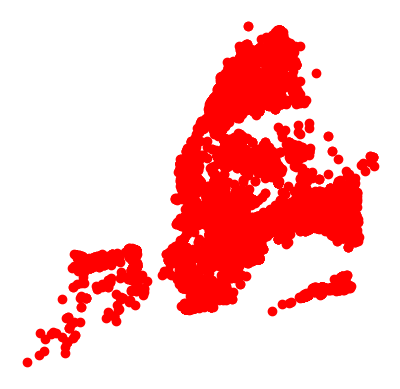

In [5]:
ax = shooting.plot(color='red',marker='o')
ax.set_axis_off()

That's too many points and its difficult to see the locations with high concentration of crimes. We could try usin gexplore method

In [7]:
shooting.explore()

As there are many points, rendering might itself become challenging.

Let us create a heatmap using this dataset. For this task we will use the geoplot library (derived from geopandas)

In [8]:
import geoplot as gplt

Let us re_project shooting to espg 4326

In [15]:
shooting_4326 = shooting.to_crs('EPSG:4326')

We will use a method called KDE plot in geoplot library

In [17]:
gplt.kdeplot?

Signature:
gplt.kdeplot(
    df,
    projection=None,
    extent=None,
    figsize=(8, 6),
    ax=None,
    clip=None,
    **kwargs,
)
Docstring:
A kernel density estimate isochrone plot.

Parameters
----------
df : GeoDataFrame
    The data being plotted.
projection : geoplot.crs object instance, optional
    The projection to use. For reference see
    :ref:`/user_guide/Working_with_Projections.ipynb`.
cmap : matplotlib color, optional
    The `colormap <https://matplotlib.org/examples/color/colormaps_reference.html>`_ to use.
clip : None or iterable or GeoSeries, optional
    If specified, isochrones will be clipped to the boundaries of this geometry.
extent : None or (min_longitude, min_latitude, max_longitude, max_latitude), optional
    Controls the plot extents. For reference see
    :ref:`/user_guide/Customizing_Plots.ipynb#extent`.
figsize : (x, y) tuple, optional
    Sets the size of the plot figure (in inches).
ax : AxesSubplot or GeoAxesSubplot instance, optional
    If set

<GeoAxesSubplot: >

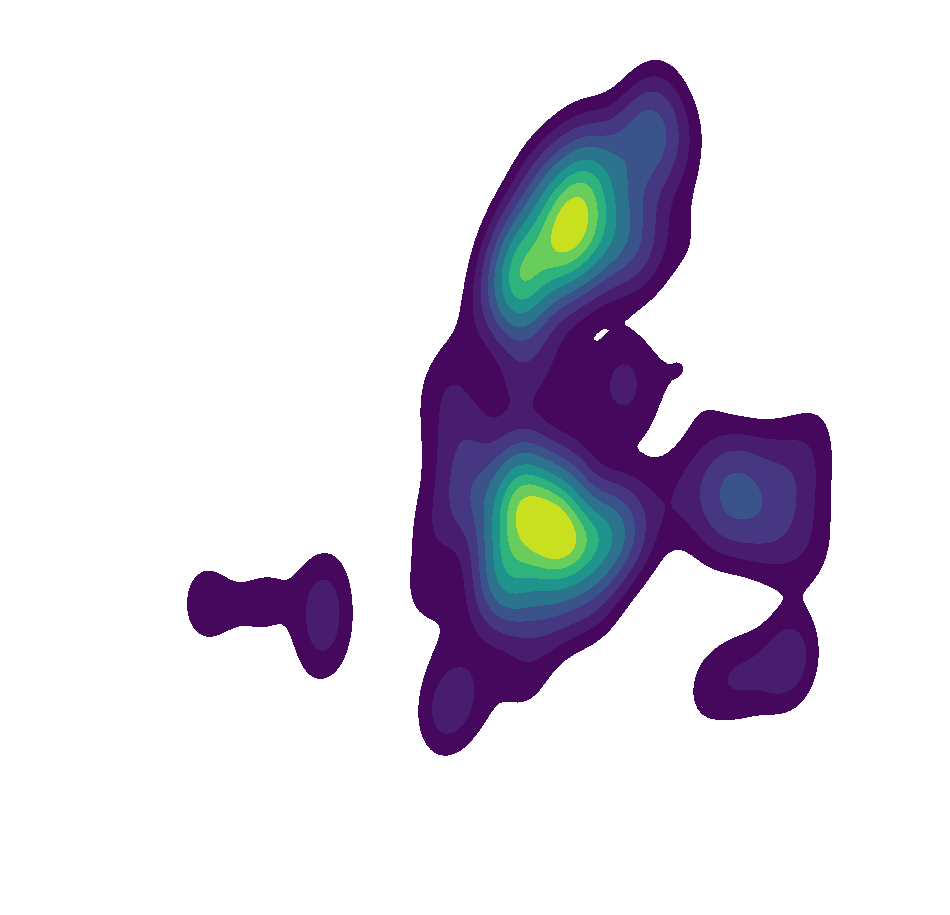

In [19]:
gplt.kdeplot(shooting_4326,cmap='viridis', projection=gcrs.WebMercator(), figsize=(12, 12),
    fill=True)

Again without reference this plot is tough to understand unless you are from NYC. So let us create a webmap (unfortunately this is not interactive)

<GeoAxesSubplot: >

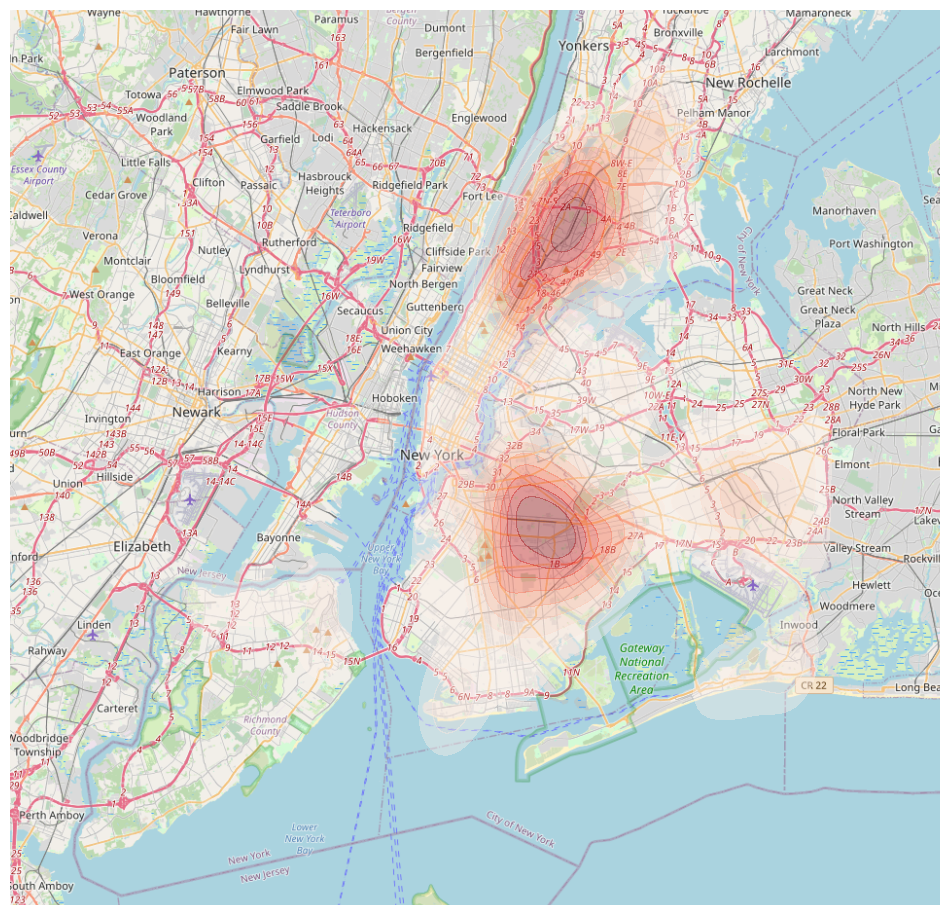

In [26]:
ax = gplt.kdeplot(shooting_4326,cmap='Reds', projection=gcrs.WebMercator(), figsize=(12, 12),
    fill=True,alpha=0.4)
gplt.webmap(shooting_4326, ax=ax)

You can also overlay kde plot along with Polygons (polyplot). Let us use our nyc neighborhoods data as the base map

In [28]:
nyc_neighborhoods = gpd.read_postgis("select gid,st_transform(geom,4326) as geom from nyc_neighborhoods",conn)

E:\sbd2\lib\site-packages\geopandas\io\sql.py:154: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(


Let us plot the neighborhood and save the axes in a variable and then use the same variable for the kdeplot

<AxesSubplot: >

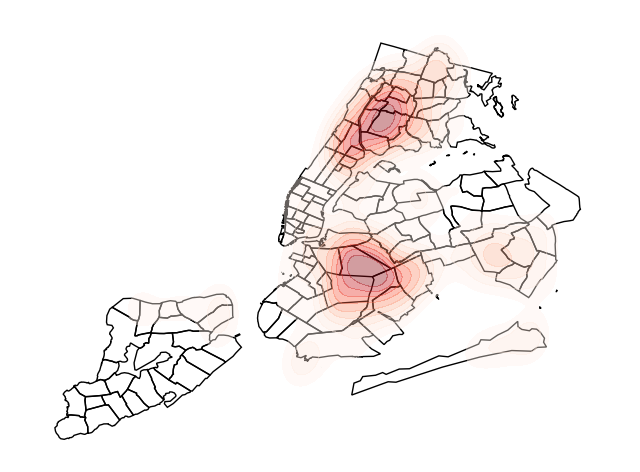

In [35]:
ax = gplt.polyplot(nyc_neighborhoods)
gplt.kdeplot(shooting_4326,cmap='Reds',ax=ax, figsize=(12, 12),
    fill=True,alpha=0.4)

You can also plot points using the pointplot method. Let us plot all the schools along with the kdeplot in webmap

In [36]:
nyc_schools = gpd.read_postgis('select gid,st_transform(geom,4326) as geom from nyc_schools',conn)

E:\sbd2\lib\site-packages\geopandas\io\sql.py:154: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(


In [37]:
nyc_schools

,gid,geom
0,1,POINT (-74.01177 40.64915)
1,2,POINT (-73.95122 40.65642)
2,3,POINT (-73.97488 40.59574)
3,4,POINT (-73.98491 40.60779)
4,5,POINT (-73.98576 40.60125)
...,...,...
1704,1705,POINT (-73.93963 40.76033)
1705,1706,POINT (-73.84301 40.85679)
1706,1707,POINT (-73.91340 40.87791)
1707,1708,POINT (-73.91325 40.87783)


<GeoAxesSubplot: >

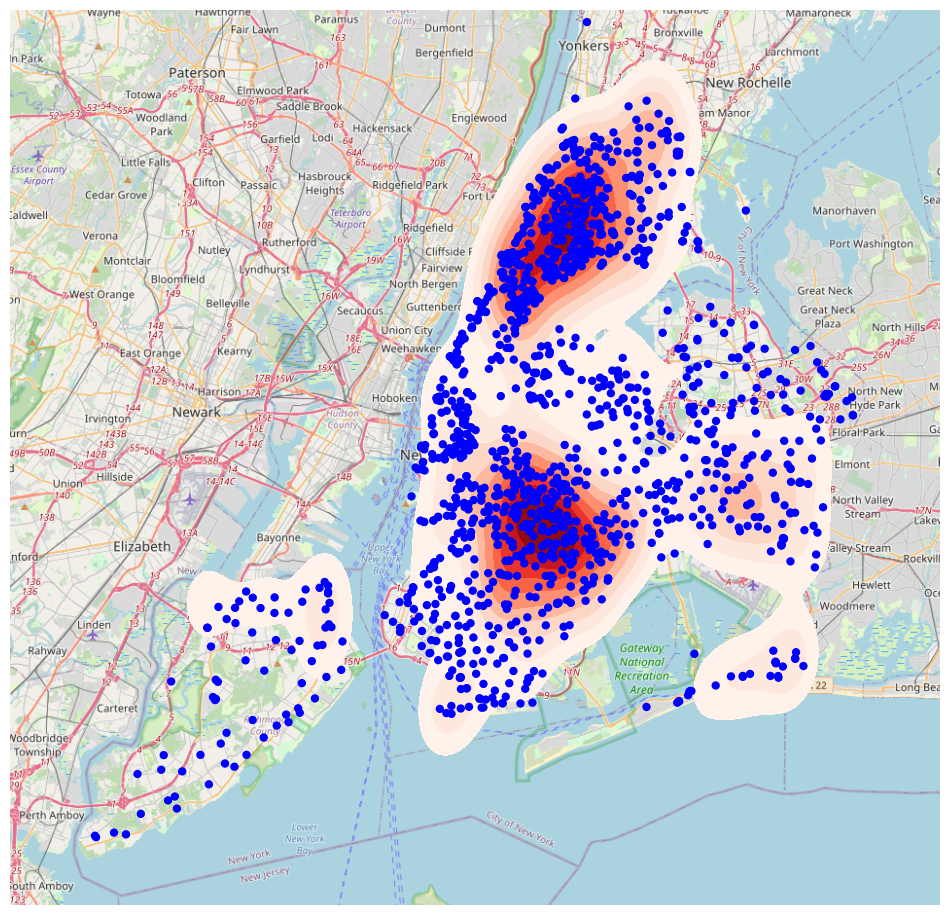

In [42]:
ax = gplt.kdeplot(shooting_4326,cmap='Reds', projection=gcrs.WebMercator(), figsize=(12, 12),
    fill=True,alpha=1)
gplt.pointplot(nyc_schools,color='blue',ax=ax)
gplt.webmap(shooting_4326, ax=ax)